# Image Super-Resolution with FastAI version 1.0

This notebook is based on the [fastai Lesson 7 notebook](https://github.com/fastai/course-v3/blob/master/nbs/dl1/lesson7-superres-gan.ipynb) from the 3rd edition of the book and [ilopezfr's modified notebooks (Part 1 and Part 2) on Github](https://github.com/ilopezfr/image-superres) with some additional notes, docstrings, code modifications, and callbacks.

The notebook uses [fastai version 1.0](https://fastai1.fast.ai/) which is deprecated and no longer supported. As such, a few quick fixes were introduced to get this to work in 2025. In hindsight, I'd update everything to work with version 2.0; however, it was a good learning experience looking deeper into this old fastai library to fix broken code.

Ignacio deserves a huge thank you for many of the notes in the original notebooks. The following key updates were made:

* New callbacks added for experiment tracking with [Weights & Biases](https://wandb.ai).
* New metric added: Peak Signal-to-Noise Ratio (PSNR)
* Converted TensorFlow High-Frequency Error Norm Normalized (HFENN) loss function to PyTorch equivalent
* Extended number of transforms with new `custom_transforms()` function
* Fixed the display of `gen_loss` and `disc_loss` with a custom callback (perhaps there's an easier option I missed?)

Deprecated code fixes:

* Fixed FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
* Fixed `fastai.vision.transform._find_coeffs` Exception: It's not possible to apply those transforms to your dataset: This function was deprecated since version 1.9 and is now removed. Please use the torch.linalg.solve function instead.
* Fixed `models.resnet34` UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future.

In this notebook, three different techniques were used to convert low-quality images into high-res images:

1. U-Net with a per-pixel MSE loss and high-frequency error norm normalized (HFENN) weighted loss
2. U-Net with perceptual loss
3. Generative adversarial network (GAN)

To train the model to perform the restoration, it's necessary to start with a dataset containing good quality images and the same images in low resolution. We'll download a public dataset and then apply a custom-made function "crappify" to add noise to the images. Then we'll proceed to construct the generator.

### Setup environment

#### Install fastai (v1.x)

In [1]:
## ORIGINAL CODE FAILS, DON'T UNCOMMENT.

#!curl https://course-v3.fast.ai/setup/colab | bash  

# Uncomment code below for collab environment
# Creates directories and symbolic links

#!mkdir -p /root/.torch/models
#!mkdir -p /root/.fastai/data
#!n -s /root/.torch/models /content
#!ln -s /root/.fastai/data /content
#!rm -rf /content/sample_data/

In [ ]:
!pip install fastai==1.0.61 # > /dev/null
!pip install numpy==1.26.4 # > /dev/null # downgrade from v2.x

In [1]:
# Fix a FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
import torch.nn.utils.parametrizations
torch.nn.utils.weight_norm = torch.nn.utils.parametrizations.weight_norm

In [2]:
# Ignore another FutureWarning. Only do this if you trust the models!
import warnings
warnings.filterwarnings("ignore", message="You are using `torch.load` with `weights_only=False`", category=FutureWarning)

In [3]:
import os
import sys
import torch

In [4]:
torch.cuda.is_available()
# Getting a strange `RuntimeError: CUDA unknown error`?
# Try `sudo rmmod nvidia_uvm`, then `sudo modprobe nvidia_uvm` to refresh.

True

In [5]:
#print(sys.executable)
print("Torch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
print("CUDA device count:", torch.cuda.device_count())
print("CUDA version:", torch.version.cuda)
print("CUDA_VISIBLE_DEVICES:", os.environ.get("CUDA_VISIBLE_DEVICES", "Not Set"))
print("Current device:", torch.cuda.current_device())
print("Device name:", torch.cuda.get_device_name(torch.cuda.current_device()))

Torch version: 2.5.1
CUDA available: True
CUDA device count: 1
CUDA version: 12.1
CUDA_VISIBLE_DEVICES: Not Set
Current device: 0
Device name: NVIDIA GeForce RTX 4070 Ti SUPER


In [ ]:
# Check the installed environment.
from fastai.utils.collect_env import *
show_install(True)

#### Import fastai libraries

In [6]:
import fastai
from fastai.vision import *
from fastai.callback import *
from fastai.vision.gan import *

#### Install Weights & Biases

In [6]:
#!pip install wandb # wandb-0.19.7

In [ ]:
import wandb

os.environ["WANDB_API_KEY"] = "<your_api_key_goes_here>"
wandb.login()

### Download dataset

In [ ]:
from pathlib import Path

path = untar_data(URLs.PETS)
path_hr = path/'images'
path_lr = path/'small-96'
#path_lr = path/'small-128'
path_mr = path/'small-256'

## Create the low-res images by "crappify-ing" the original ones

We need a dataset with both good quality ("nice") images and crappy version of the same images.

Anything that you want your model to fix, you should include as operation in the crappify function. If you don't include an operation to create wrinkles in the images, the generator won't consider wrinkles as something worth of fixing. 

Prepare the input data by making "crappy" images. We'll add a random number (`q`, which also denotes jpg quality) to the "crappy" image to assess how well the model can learn to remove the number.

In [9]:
from PIL import Image, ImageDraw

In [10]:
numbers = True # Change to False if you don't want random numbers added (e.g. for the mid-resolution images)

class crappifier(object):
    """Enables batch-processing of images by calling the instance."""   
    def __init__(self, path_lr, path_hr):
        self.path_lr = path_lr
        self.path_hr = path_hr              
        
    def __call__(self, fn, i):  
        """Crappify function"""
        dest = self.path_lr/fn.relative_to(self.path_hr)   
        dest.parent.mkdir(parents=True, exist_ok=True)
        # Open up a "nice" image
        img = PIL.Image.open(fn)
        
        # Computes target size such that the minimum dimension becomes 96 pixels, while preserving aspect ratio
        # Change 96 to your desired minimum dimension
        targ_sz = resize_to(img, 96, use_min=True)
        
        # Resize using bilinear interpolation
        img = img.resize(targ_sz, resample=PIL.Image.BILINEAR).convert('RGB')
                
        # Draw a random number (q) into the image at a random location. 
        w,h = img.size
        q = random.randint(10,70)
        if numbers:
            ImageDraw.Draw(img).text((random.randint(0,w//2),random.randint(0,h//2)), str(q), fill=(255,255,255))
        
        # Save the "crappified" into dest; lower q > more compression.
        img.save(dest, quality=q)

We can use fastai's **`parallel()`**  to apply the **`crappify()`**` function created in parallel to the entire folder of images.

Uncomment the line below the first time you run this notebook.

In [11]:
il = ImageList.from_folder(path_hr)
print(len(il))
#parallel(crappifier(path_lr, path_hr), il.items)

7390


Verify that it worked by checking a random image and it's crappified copy:


scottish_terrier_62.jpg
File Size: 109.06 KB
Resolution: 500 x 333
Color Mode: RGB
Image Format: JPEG


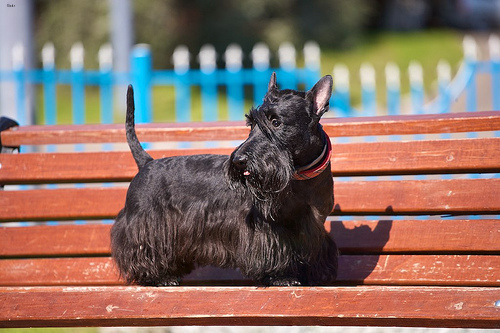

In [40]:
# Pick a random image from the directory
import random

a=random.choice(os.listdir(path/'images'))
print(a)

file = os.path.join(path/'images',a)
img = Image.open(file)

# Get image details
file_size = os.path.getsize(file) / 1024  # Convert bytes to KB
width, height = img.size
color_mode = img.mode  # RGB, RGBA, L, etc.
img_format = img.format  # JPEG, PNG, etc.

# Show image details
print(f"File Size: {file_size:.2f} KB")
print(f"Resolution: {width} x {height}")
print(f"Color Mode: {color_mode}")
print(f"Image Format: {img_format}")

# Display the image
img

Resolution: 144 x 96


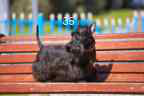

In [41]:
# and its crappified correspondent:
file = os.path.join(path/'small-96',a)
img = Image.open(file)
width, height = img.size
print(f"Resolution: {width} x {height}")
img

## Set batch size and training image size
`size` sets the dimensions images will be resized to during training (e.g. 128x128 pixels)
Smaller batch sizes use less memory but may train slower. Modify batch size as appropriate for your GPU VRAM.

For gradual resizing we can change the commented lines here.

In [12]:
#bs,size = 12, 512
#bs,size = 34, 256
bs,size = 72, 128

## Method 1: U-Net with Weighted HFENN and MSE Loss

We'll use a [U-Net](https://arxiv.org/abs/1505.04597) with a ResNet34 as the architecture for the encoder, with a weighted HFENN and per-pixed MSE loss function.

### Setup U-Net Architecture

First, we'll have to fix some deprecated code in fastai version 1.0.

In [13]:
#arch = models.resnet34 # SEE UPDATE BELOW

#### Fix UserWarning in ResNet Architecture

Defining `arch = models.resnet34` will cause the following issue:
```
UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
```
The solution is to create a function that returns the model with explicit weights:

In [14]:
from torchvision.models import ResNet34_Weights
#from torchvision.models import resnet50, ResNet50_Weights

def get_arch(pretrained=True):
    # The pretrained parameter is now handled by the weights parameter
    if pretrained:
        return models.resnet34(weights=ResNet34_Weights.DEFAULT)
    else:
        return models.resnet34(weights=None)

This approach resolves the warning by specifying the weights parameter according to the new PyTorch API. It also maintains compatibility with fastai, which expects architecture to be passed as a function rather than an instantiated model.

This function also accepts the pretrained parameter that fastai tries to pass to it, translating that parameter into the appropriate weights setting for the newer PyTorch API.

### Setup data source

The data source `src` represents the source images prior to any transformations/augmentations. We'll use ImageImageList, which is a FastAI class designed for image-to-image tasks (e.g., super-resolution, style transfer).

In [15]:
# Split dataset: 90% for training, 10% for testing
src = ImageImageList.from_folder(path_lr).split_by_rand_pct(0.1, seed=40)

### Define image transformations/augmentations

In [16]:
# Easy example:
#tfms = get_transforms(do_flip=True)

In [17]:
def custom_transforms():
    """
    Returns a tuple of two lists of transforms for training and validation.
    Applies brightness, contrast, rotation, and zoom adjustments during training.
    """
    train_tfms = [
        brightness(change=(0.3, 0.6), p=0.7),  # Random brightness adjustment
        contrast(scale=(0.4, 1.8), p=0.7),    # Random contrast adjustment
        # rotate(degrees=180, p=0.3),  # Rotate at 180° increment
        zoom(scale=(1.0, 1.2), row_pct=0.5, col_pct=0.5, p=0.5),  # Slight centered zoom
        # Cutout random squares. Don't use if tfm_y=True as this applies to both x and y otherwise.
        # cutout(n_holes=(1, 2), length=(10, 60), p=0.5)  
    ]
    
    valid_tfms = []  # No augmentation for the validation set
    
    return (train_tfms, valid_tfms)

# Setup transforms
tfms = custom_transforms()

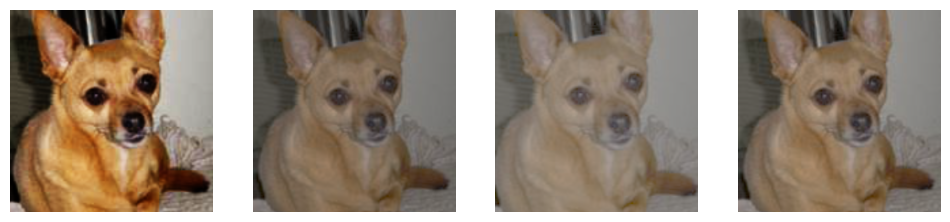

In [17]:
def test_custom_transforms(img_path, n_samples=4):
    """
    Loads an image, applies custom transforms multiple times, and visualizes the results.
    """
    img = open_image(img_path)
    train_tfms, _ = custom_transforms()
    fig, axs = plt.subplots(1, n_samples, figsize=(12, 4))

    for ax in axs:
        img.apply_tfms(train_tfms, size=256).show(ax=ax)

    plt.show()

a=random.choice(os.listdir(path_hr))
image_path = os.path.join(path_hr, a)
test_custom_transforms(image_path)

### Get DataBunch (a bunch of DataLoaders)

Fastai v1.0 uses a DataBunch object to manage datasets during training. It is essentially a bunch of pytorch dataloaders, consisting of:  

*    train_dl: DataLoader for the training set.
*    valid_dl: DataLoader for the validation set.
*    test_dl: DataLoader for the test set (optional).

In [18]:
def get_data(bs, size):
    """
    Creates and returns a DataBunch for training a super-resolution model using paired 
    low-resolution (LR) and high-resolution (HR) images.

    Args:
        bs (int): Batch size for training and validation.
        size (int or tuple): Target size for image resizing.

    Returns:
        DataBunch: A fastai DataBunch containing:
            - LR images as input
            - HR images as labels (targets)
            - Applied transformations (augmentation, resizing)
            - Normalized images
            - Training and validation splits

    Notes:
        - Depends on the global variable `src` to obtain dataset(s).
        - Normalizes both LR and HR images using ImageNet statistics.
        - Transformations are applied dynamically (not saved).
        - The same transformations are applied to both LR and HR images (`tfm_y=True`).
        - Matching between LR and HR is done by filename.
    """
    data = (
        src.label_from_func(lambda x: path_hr / x.name)  # Match LR images to HR counterparts
            .transform(tfms, size=size, resize_method=None, tfm_y=True) # Apply augmentations; resize both LR and HR to 'size'
            .databunch(bs=bs)  # Create a DataBunch with the given batch size
            .normalize(imagenet_stats, do_y=True)  # Normalize both input (LR) and target (HR) images
    )
    data.c = 3  # Ensures RGB images
    return data

**Additional notes** 

Use of `imagenet_stats`: The pixel distributions in this dataset are likely similar enough for ImageNet stats to be a decent default normalization. Also, we're using a ResNet, which was pre-trained on ImageNet. No need to recalculate this for our current dataset.

Note, if the images are originally smaller than `size`, they will be upsampled to `size`. Similarly, if the images are larger than `size`, they will be downsampled. This should ensure that all images fed into the model have a consistent shape. From reading the docs, it seems the  default `ResizeMethod` (when `resize_method=None`) is `SQUISH`, which could possibly introduce distortion in the aspect ratio. I haven't really looked into this much though.

#### Fix Deprecated Function 

The original code caused an "Exception: It's not possible to apply those transforms to your dataset: This function was deprecated since version 1.9 and is now removed. Please use the `torch.linalg.solve` function instead."

In [19]:
def _find_coeffs(orig_pts: Tensor, targ_pts: Tensor) -> Tensor:
    "Find 8 coefficients for perspective transformation."
    matrix = []
    # Construct the linear system
    for p1, p2 in zip(targ_pts, orig_pts):
        matrix.append([p1[0], p1[1], 1, 0, 0, 0, -p2[0] * p1[0], -p2[0] * p1[1]])
        matrix.append([0, 0, 0, p1[0], p1[1], 1, -p2[1] * p1[0], -p2[1] * p1[1]])

    A = FloatTensor(matrix)
    B = FloatTensor(orig_pts).view(8, 1)

    # Replacement for deprecated function:
    # Use `torch.linalg.solve` instead of `_solve_func`
    coeffs = torch.linalg.solve(A, B)
    
    return coeffs[:, 0]

# Overwrite the function in fastai
fastai.vision.transform._find_coeffs = _find_coeffs

In [20]:
print(len(src.train), len(src.valid))
print(src.train[0])  # Check first training sample

6651 739
Image (3, 96, 115)


In [21]:
data_gen = get_data(bs,size)

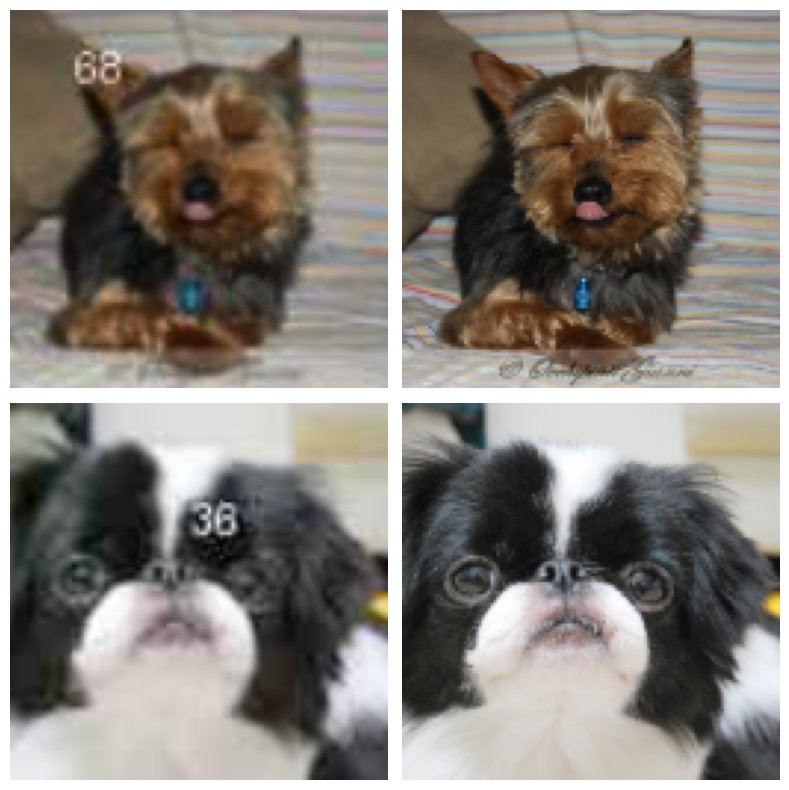

In [23]:
data_gen.show_batch(2)

### New metric: Peak Signal-to-Noise Ratio (PSNR)

To compare the models objectively, let's create a PSNR metric. Per [wikipedia](https://en.wikipedia.org/wiki/Peak_signal-to-noise_ratio), "Peak signal-to-noise ratio (PSNR) is an engineering term for the ratio between the maximum possible power of a signal and the power of corrupting noise that affects the fidelity of its representation. Because many signals have a very wide dynamic range, PSNR is usually expressed as a logarithmic quantity using the decibel scale. PSNR is commonly used to quantify reconstruction quality for images and video subject to lossy compression." 

We'll create a simple metric for batch-wise PSNR in fastai v1.0. We can pass it into `Learner(..., metrics=[psnr])` and FastAI v1 will wrap it as an `AverageMetric` automatically. Higher values are better, i.e., more signal (image quality) and less noise.

In [24]:
def psnr(pred, targ, max_val=1.0):
    "Peak Signal-to-Noise Ratio metric"
    pred, targ = flatten_check(pred, targ)
    mse = F.mse_loss(pred, targ)
    return 20 * torch.log10(max_val / torch.sqrt(mse + 1e-8))

### U-Net Callback for W&B

In fastai version 1, the wandb library included a fastai callback: `from wandb.fastai import WandbCallback`. 
However, this has now been removed from wandb and the import is broken. 

In fastai version 2, the callback is in the fastai library itself: i.e., `from fastai.callback.wandb import WandbCallback`. It doesn't exist in version 1, so let's create our own instead.

In [25]:
class WandbUNetCallbackV1(Callback):
    def __init__(self, learn, log="gradients"):
        self.learn = learn
        self.log = log
        self.mse_losses = []
        self.hfenn_losses = []
        self.combined_losses = []
        
    def on_train_begin(self, **kwargs):
        "Initialize W&B logging and watch model"
        if wandb.run is None:
            raise ValueError('You must call wandb.init() before using WandbUNetCallbackV1')
        
        wandb.watch(self.learn.model, log=self.log)
        
    def on_epoch_begin(self, **kwargs):
        "Reset loss tracking at the beginning of each epoch"
        self.mse_losses = []
        self.hfenn_losses = []
        self.combined_losses = []
        
    def on_batch_end(self, iteration, last_loss, **kwargs):
        "Log training loss and collect custom losses"
        # Assuming 'last_loss' is the combined loss, extract MSE and HFENN
        loss_func = self.learn.loss_func
        if hasattr(loss_func, 'last_mse') and hasattr(loss_func, 'last_hfenn'):
            mse_loss = loss_func.last_mse.item()
            hfenn_loss = loss_func.last_hfenn.item()
            
            self.mse_losses.append(mse_loss)
            self.hfenn_losses.append(hfenn_loss)
            self.combined_losses.append(last_loss)
      
        # Log learning rate
        lr = self.learn.opt.lr  # Get learning rate
        wandb.log({"learning_rate": lr})
        
        # Log combined loss
        wandb.log({"train_loss": last_loss})
        
    def on_epoch_end(self, epoch, last_metrics, **kwargs):
        "Log validation loss, metrics, and custom losses"
        log_data = {"epoch": epoch, "valid_loss": last_metrics[0]}
        
        if len(last_metrics) > 1:
            for i, metric in enumerate(self.learn.metrics):
                #log_data[f"metric_{metric.__name__}"] = last_metrics[i + 1]
                metric_name = getattr(metric, '__name__', metric.__class__.__name__)
                log_data[f"metric_{metric_name}"] = last_metrics[i + 1]
        
        # Compute average losses safely
        log_data["gen_loss"] = sum(self.combined_losses) / len(self.combined_losses) if self.combined_losses else 0.0
        log_data["mse_loss"] = sum(self.mse_losses) / len(self.mse_losses) if self.mse_losses else 0.0
        log_data["hfenn_loss"] = sum(self.hfenn_losses) / len(self.hfenn_losses) if self.hfenn_losses else 0.0
            
        wandb.log(log_data)
        
        return {}  # Ensure fastai doesn't break

In [ ]:
# Initialize W&B project
wandb.init(project="super-resolution-Unet", name="ResNet-Training-AdamW-HFENN-r8")

In [27]:
# The original notebook set a value for weight decay for regularization
# wd = 1e-3  

# Let's replace this with AdamW optimization, instead of the predefined weight decay.
AdamW = partial(optim.Adam, betas=(0.9,0.99))

# By default, AdamW includes the weight decay in the optimizer, 
# so no need to specify it separately in the Learner.

**Constrain output values of the U-Net**

Predicted pixel values of the U-Net will be restricted to the range `[−3,3]`. Useful if the target output has known bounds, such as normalized or transformed images where the pixel values should remain within a meaningful range.

In [28]:
y_range = (-3.,3.)

Previously the workbook used Mean Square Error (MSE) loss 
* calculates the  the average MSE between the pixel value predicted and the actual pixel value. 
* MSELoss takes 2 vectors; `MSELossFlat()` flattens out those images

In [29]:
#loss_gen = MSELossFlat()

### HFENN-MSE Combined Loss Function

The HFENN (High Frequency Error Norm Normalized) metric quantifies differences in high-frequency details between two images.
A value of 0 indicates identical images, while higher values indicate greater perceptual differences.

To improve perceptual quality, we combine Mean Squared Error (MSE) loss with HFENN. MSE captures pixel-wise differences, while HFENN ensures that high-frequency details are preserved in reconstructed images. We use a weighted sum of both losses for a more balanced optimization.

This implementation was adapted from this [ilopezfr notebook](https://github.com/ilopezfr/image-superres/blob/master/Image_Super_Resolution_using_Autoencoders.ipynb). I revised it to use PyTorch instead of TensorFlow/Keras. If I were you, I would not 100% trust my implementation and would first test it directly against the original TensorFlow code.

In [30]:
#import numpy as np
#import torch.nn.functional as F
from scipy.ndimage import gaussian_laplace

def laplacian_of_gaussian(img: np.ndarray, sigma: float) -> np.ndarray:
    """
    Applies a Laplacian of Gaussian (LoG) filter to an image channel-wise.
    
    Parameters:
    img (np.ndarray): Input image (2D or 3D with channels).
    sigma (float): Standard deviation for Gaussian kernel.
    
    Returns:
    np.ndarray: Image after applying LoG filter.
    """
    if img.ndim < 3:
        img = img[..., np.newaxis]  # Ensure 3D shape
    
    out = np.empty_like(img)
    for chan in range(img.shape[2]):
        out[..., chan] = gaussian_laplace(img[..., chan], sigma)
    
    return out

def hfenn_metric(original: np.ndarray, result: np.ndarray) -> float:
    """
    Computes the High Frequency Error Norm Normalized (HFENN) metric between an original and a result image.
    
    Parameters:
    original (np.ndarray): Ground truth image (values expected in range [0,1]).
    result (np.ndarray): Predicted image (values expected in range [0,1]).
    
    Returns:
    float: HFENN score (lower is better, 0 indicates identical images).
    """
    sigma = 1.5  # Parameter from the DLMRI paper
    return np.mean(laplacian_of_gaussian(original - result, sigma) ** 2) * 1e4 # multiply by 1e4 for readability

In [31]:
def hfenn_loss(original: torch.Tensor, result: torch.Tensor) -> torch.Tensor:
    """
    HFENN-based loss function for deep learning models.
    
    Parameters:
    original (torch.Tensor): Ground truth image tensor (batch, channels, height, width).
    result (torch.Tensor): Predicted image tensor (batch, channels, height, width).
    
    Returns:
    torch.Tensor: HFENN loss value as a scalar tensor
       
    Note:
    -----
    This is a PyTorch implementation equivalent to a TensorFlow/Keras version
    that uses tf.nn.depthwise_conv2d with 'VALID' padding.
    """
    fnorm = 0.325  # Estimated norm of LoG operator
    sigma = 1.5  # Standard deviation for Gaussian kernel
    truncate = 4  # Default parameter from filters.gaussian_laplace
    wradius = int(truncate * sigma + 0.5)
    
    # Create eye kernel
    eye = np.zeros((2 * wradius + 1, 2 * wradius + 1), dtype=np.float32)
    eye[wradius, wradius] = 1.0
    ker_mat = gaussian_laplace(eye, sigma)
    
    # Move tensors to the same device
    device = original.device
    
    # Create kernel for depthwise convolution
    # In PyTorch, depthwise conv expects kernel shape [out_channels, in_channels/groups, kH, kW]
    # For depthwise: out_channels = in_channels, groups = in_channels
    channels = original.size(1)
    kernel = torch.tensor(ker_mat, dtype=torch.float32).to(device)
    kernel = kernel.unsqueeze(0).unsqueeze(0).repeat(channels, 1, 1, 1)
    
    # Compute difference
    diff = original - result
    
    # Use tensorflow 'valid' padding (which means no padding in PyTorch)
    # This will reduce the spatial dimensions
    filtered = F.conv2d(diff, kernel, padding=0, groups=channels)
    
    # Compute loss
    loss = torch.mean(filtered ** 2) / (fnorm ** 2)
    
    return loss

In [32]:
# # Minimal version
# class CombinedLoss(nn.Module):
#     """Computes a weighted sum of MSE loss and HFENN loss."""
#     def __init__(self, weight=10.0):
#         super().__init__()
#         self.weight = weight
        
#     def forward(self, input_img, decoded_img):
#         mse_loss = F.mse_loss(input_img, decoded_img)
#         hfenn = hfenn_loss(input_img, decoded_img)
#         return mse_loss + self.weight * hfenn

In [33]:
class CombinedLoss(nn.Module):
    """
    Computes a weighted sum of MSE loss and HFENN loss.
    Exposes individual loss components for logging.
    """
    def __init__(self, weight=10.0):
        super().__init__()
        self.weight = weight
        # Store last component values for logging
        self.last_mse = 0.0
        self.last_hfenn = 0.0
        
    def forward(self, input_img, decoded_img):
        # Calculate individual loss components
        mse_loss = F.mse_loss(input_img, decoded_img)
        hfenn = hfenn_loss(input_img, decoded_img)
        
        # Store for later reference by the callback
        self.last_mse = mse_loss.detach()
        self.last_hfenn = hfenn.detach()
        
        # Calculate combined loss
        combined = mse_loss + self.weight * hfenn
        
        return combined

#### Testing combined loss function

In [34]:
# Create random tensors simulating images (batch_size=2, channels=3, height=128, width=128)
original = torch.rand(2, 3, 128, 128, requires_grad=True)
reconstructed = torch.rand(2, 3, 128, 128, requires_grad=True)

In [35]:
# Case 1: Identical images (should give near 0 loss)
identical_loss = hfenn_loss(original, original)
print(f"Identical HFENN Loss: {identical_loss.item():.6f}")  # Expect ≈ 0

# Case 2: Slightly different image (small loss)
slightly_different = original + 0.01 * torch.randn_like(original)  # Small perturbation
small_diff_loss = hfenn_loss(original, slightly_different)
print(f"Slightly Different HFENN Loss: {small_diff_loss.item():.6f}")  # Expect small value

# Case 3: Completely different image (high loss)
completely_different = torch.rand_like(original)  # Unrelated random image
high_loss = hfenn_loss(original, completely_different)
print(f"Completely Different HFENN Loss: {high_loss.item():.6f}")  # Expect higher value

#  Expected:
#    Identical: Loss ≈ 0
#    Slight difference: Small loss
#    Completely different: Higher loss

Identical HFENN Loss: 0.000000
Slightly Different HFENN Loss: 0.000013
Completely Different HFENN Loss: 0.022115


In [37]:
a=random.choice(os.listdir(path/'images'))
print(a)
image_path = os.path.join(path/'images',a)

pomeranian_78.jpg


Blurred Image Loss: 0.020586


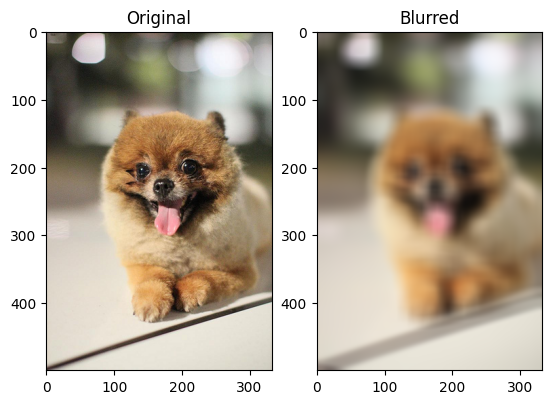

In [38]:
# Example with real images

import torchvision.transforms as T
import matplotlib.pyplot as plt

# Load and preprocess an image
def load_image(image_path):
    transform = T.Compose([
        T.ToTensor()  # Convert image to tensor (C, H, W) in range [0,1]
    ])
    image = Image.open(image_path).convert("RGB")  # Ensure 3 channels
    return transform(image).unsqueeze(0)  # Add batch dimension (1, C, H, W)

# Apply an augmentation (e.g., Gaussian blur)
def apply_augmentation(image_tensor, blur_radius=45):
    transform = T.GaussianBlur(kernel_size=23, sigma=blur_radius)
    return transform(image_tensor)

# Test the loss function
def test_loss_function(image_path):
    original = load_image(image_path)
    blurred = apply_augmentation(original)

    loss_fn = CombinedLoss()
    loss_value = loss_fn(original, blurred)

    print(f"Blurred Image Loss: {loss_value.item():.6f}")

    # Display original and blurred images
    fig, ax = plt.subplots(1, 2)
    ax[0].imshow(original.squeeze(0).permute(1, 2, 0))  # Convert tensor to image format
    ax[0].set_title("Original")
    ax[1].imshow(blurred.squeeze(0).permute(1, 2, 0))
    ax[1].set_title("Blurred")
    plt.show()

test_loss_function(image_path)

### Create Learner based on pretrained model 

Per the docs at https://fastai1.fast.ai/vision.models.unet.html#DynamicUnet

"`blur` is used to avoid checkerboard artifacts at each layer, `blur_final` is specific to the last layer. `self_attention` determines if we use a self attention layer at the third block before the end. If `y_range` is passed, the last activations go through a sigmoid rescaled to that range. `last_cross` determines if we use a cross-connection with the direct input of the model, and in this case `bottle` flags if we use a bottleneck or not for that skip connection."


In [39]:
# Import weight normalization (fixed above)
#from torch.nn.utils.parametrizations import weight_norm

# Create learner based on a pretrained model (on ImageNet)
def create_gen_learner():
    return unet_learner(
        data_gen,
        arch=get_arch,
        opt_func=AdamW,
        #wd=wd, not needed with AdamW
        blur=True,
        norm_type=NormType.Weight,
        self_attention=True,
        y_range=y_range,
        loss_func=CombinedLoss(weight=8.0), # was MSELossFlat(),
        pretrained=True, # added per fix above
        callback_fns=WandbUNetCallbackV1,
        metrics=[psnr]
    )

### Find learning rate

In [37]:
learn_gen = create_gen_learner()

In [38]:
# Run lr_find() on the learner
learn_gen.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


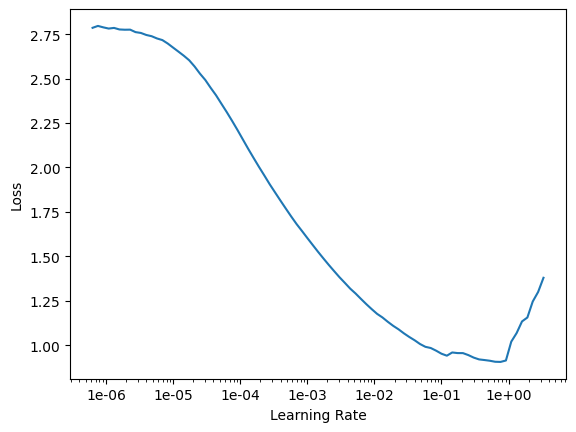

In [39]:
# Plot the learning rate vs loss graph
learn_gen.recorder.plot()

### Train model

* in fastai library learner does transfer learning by default, so when creating it, it'll freeze the pre-trained part. 
* In the case of a U-net, the pre-trained part is the left side of the U.  

In [40]:
learn_gen = create_gen_learner()

In [43]:
learn_gen.fit_one_cycle(6, pct_start=0.8) # cycles the learning rate

epoch,train_loss,valid_loss,psnr,time
0,0.310122,0.199581,11.439946,00:23
1,0.181584,0.158769,12.770288,00:19
2,0.151876,0.163937,12.465519,00:19
3,0.143650,0.141890,13.258200,00:19
4,0.139127,0.140092,13.308690,00:19
5,0.131706,0.133845,13.521447,00:19


Unfreeze and train more:

In [44]:
learn_gen.unfreeze()

In [45]:
# Let's run this for 34 more epochs (40 total)
learn_gen.fit_one_cycle(34, slice(1e-6,1e-3))

epoch,train_loss,valid_loss,psnr,time
0,0.128332,0.137208,13.462110,00:20
1,0.126441,0.136714,13.473359,00:20
2,0.126700,0.136110,13.478920,00:20
3,0.127878,0.135262,13.486650,00:20
4,0.125759,0.134683,13.525356,00:20
5,0.123406,0.133375,13.559175,00:20
6,0.123357,0.132669,13.575733,00:20
7,0.122335,0.133781,13.536009,00:20
8,0.119026,0.133340,13.559317,00:20
9,0.117988,0.133164,13.560268,00:20


Curious why it was slow to start learning again? The cyclical learning rate takes a while to ramp up at the start. Here's the W&B chart for an earlier run, including the 6 initial epochs above:

<div>
<img src="attachment:9698801f-ee49-4257-ad36-d190e9ce98ae.png" width="500"/>
</div>

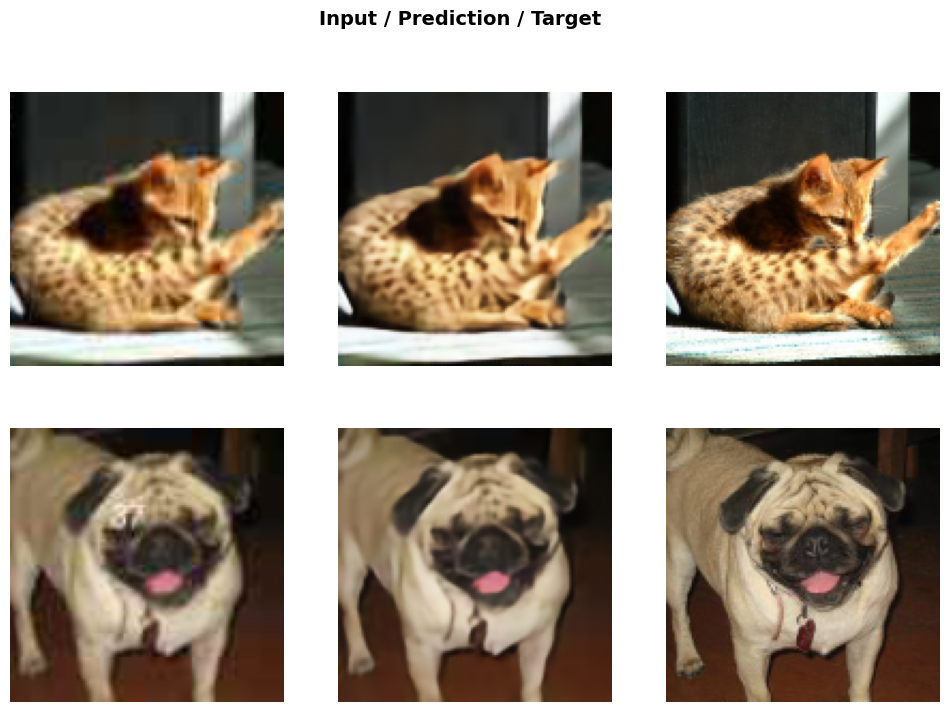

In [46]:
learn_gen.show_results(rows=2)

#### Results

* It does a reasonable job removing the numbers from the image (e.g., on the dog's face above).
* Not great in terms of resolution and quality (lacking texture) when compared with that of the actual image.

We could train for longer and increase the image resolution (example below), but overall the results were not amazing.

In [ ]:
learn_gen.save('gen-pre-128px')
#learn_gen.load('gen-pre-128px')

Example code to train with higher resolution images:

In [ ]:
# New batch size and image dimensions ('size')
bs,size = 16, 512

# Create a new DataBunch
data_gen = get_data(bs, size)

# Assign the new DataBunch to the learner
learn_gen.data = data_gen

# Let's also try adjusting the weighting in the loss function back to default
learn_gen.loss_func = CombinedLoss(weight=10.0)

In [ ]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(60, slice(1e-6,1e-3))

In [ ]:
learn_gen.show_results(rows=8)

In [ ]:
wandb.finish()

## Save images for GAN training dataset

We'll need to create a directory to store the generated images for later use when training the critic (discriminator) in our GAN. These images will be combined with real images to train the discriminator.

In [ ]:
#learn_gen.load('gen-pre-128px') # Method 1
#learn_gen.load('1c') # Method 2

In [28]:
name_gen = 'image_gen'
path_gen = path/name_gen
path_gen.mkdir(exist_ok=True)

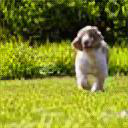

In [29]:
def save_preds(dl):
    i = 0
    names = dl.dataset.items  # Get the filenames from the dataset
    
    for b in dl:  # Iterate through batches in the dataloader
        preds = learn_gen.pred_batch(batch=b, reconstruct=True)  # Generate images using `learn_gen`
        for o in preds:  # Iterate over the generated images
            o.save(path_gen/names[i].name)  # Save each generated image with the corresponding name
            i += 1  # Move to the next filename

save_preds(data_gen.fix_dl)

PIL.Image.open(path_gen.ls()[0])

**Clean up**

To avoid restarting the kernel and GPU. Let's do memory garbage collection and clear the CUDA cache on the GPU.

In [55]:
import gc
torch.cuda.empty_cache()
learn_gen=None
gc.collect()

0

In [80]:
#!nvidia-smi

## Method 2: U-Net with Perceptual Loss

The code in this section is largely copied from [ilopezfr's notebook (Part 2) on Github](https://github.com/ilopezfr/image-superres/blob/master/image_superres_part2_fastai.ipynb) with some additional notes and a custom callback for Weights & Biases.

Based on Justin et al paper paper [Perceptual Losses for Real-Time Style Transfer and Super-Resolution](https://arxiv.org/abs/1603.08155), we create a loss function using feature/perceptual losses.

Overall, the perceptual loss has three components:

* Pixel loss (e.g. MSE or L1): Basic reconstruction
* Feature loss: Semantic content matching using CNN feature maps
* Gram matrix/style loss: Texture and style matching

We'll use a VGG model to extract the representation. Reasons for using a VGG model over ResNet include the following:

* VGG models use a sequential structure with convolutions and ReLUs, making feature representations straightforward.
* ResNet's residual connections create dependencies across layers, which can make feature maps less interpretable for perceptual loss.
* Historical precedent and empirical success, as early influential papers (Johnson et al., 2016) established VGG as a standard feature extractor.

The Gram matrix captures the correlation between different channels of the feature maps. It provides a way to compare the style of different feature maps by computing how the activations are related to each other. Each element in the matrix represents the correlation between two channels (features) at different spatial locations.

In [30]:
def gram_matrix(x):
    n, c, h, w = x.size()
    x = x.view(n, c, -1)
    return (x @ x.transpose(1, 2)) / (c * h * w)

In [31]:
from fastai.callbacks.hooks import hook_outputs

class FeatureLoss(nn.Module):
    def __init__(self, m_feat, layer_ids, layer_wgts):
        super().__init__()
        self.m_feat = m_feat
        self.loss_features = [self.m_feat[i] for i in layer_ids]
        self.hooks = hook_outputs(self.loss_features, detach=False)
        self.wgts = layer_wgts
        self.metric_names = ['pixel',] + \
                            [f'feat_{i}' for i in range(len(layer_ids))] + \
                            [f'gram_{i}' for i in range(len(layer_ids))]
        
        # Component tracking for the callback
        self.last_pixel_loss = 0.0
        self.last_feat_losses = []
        self.last_gram_losses = []
        
    def make_features(self, x, clone=False):
        self.m_feat(x)
        return [(o.clone() if clone else o) for o in self.hooks.stored]
    
    def forward(self, input, target):
        out_feat = self.make_features(target, clone=True)
        in_feat = self.make_features(input)
        
        # Use L1 as the base loss
        base_loss = F.l1_loss
        
        # Pixel-level loss
        pixel_loss = base_loss(input, target)
        self.last_pixel_loss = pixel_loss.detach().item()
        
        # Initialize losses list
        self.feat_losses = [pixel_loss]
        
        # Feature losses
        self.last_feat_losses = []
        for f_in, f_out, w in zip(in_feat, out_feat, self.wgts):
            feat_loss = base_loss(f_in, f_out) * w
            self.feat_losses.append(feat_loss)
            self.last_feat_losses.append(feat_loss.detach().item())
        
        # Gram matrix / style losses
        self.last_gram_losses = []
        for f_in, f_out, w in zip(in_feat, out_feat, self.wgts):
            gram_loss = base_loss(gram_matrix(f_in), gram_matrix(f_out)) * w**2 * 5e3 # loss weighting
            self.feat_losses.append(gram_loss)
            self.last_gram_losses.append(gram_loss.detach().item())
        
        # Calculate metrics for each loss component
        self.metrics = dict(zip(self.metric_names, self.feat_losses))
        
        # Return the total loss (sum of all components)
        return sum(self.feat_losses)
    
    def __del__(self):
        self.hooks.remove()

### Feature Loss Callback for W&B

In [32]:
class WandbFeatureLossCallback(Callback):
    """
    Callback for tracking FeatureLoss components with Weights & Biases
    """
    def __init__(self, learn, log_freq=1, log="gradients"):
        self.learn = learn
        self.log_freq = log_freq
        self.log = log
        
        # For tracking losses
        self.total_losses = []
        self.pixel_losses = []
        self.feat_losses_by_layer = {}  # Dictionary to track each feature layer separately
        self.gram_losses_by_layer = {}  # Dictionary to track each gram layer separately
        self.avg_feat_losses = []
        self.avg_gram_losses = []
        
    def on_train_begin(self, **kwargs):
        "Initialize W&B logging and watch model"
        if wandb.run is None:
            raise ValueError('You must call wandb.init() before using WandbFeatureLossCallback')
        
        # Set up model tracking
        wandb.watch(self.learn.model, log=self.log)
        
        # Set up feature/gram loss tracking based on the number of layers
        if hasattr(self.learn.loss_func, 'wgts'):
            num_layers = len(self.learn.loss_func.wgts)
            for i in range(num_layers):
                self.feat_losses_by_layer[f'feat_{i}'] = []
                self.gram_losses_by_layer[f'gram_{i}'] = []
        
    def on_epoch_begin(self, **kwargs):
        "Reset loss tracking at the beginning of each epoch"
        self.total_losses = []
        self.pixel_losses = []
        self.avg_feat_losses = []
        self.avg_gram_losses = []
        
        # Reset individual layer tracking
        for key in self.feat_losses_by_layer:
            self.feat_losses_by_layer[key] = []
        for key in self.gram_losses_by_layer:
            self.gram_losses_by_layer[key] = []
        
    def on_batch_end(self, iteration, last_loss, **kwargs):
        "Log training loss and collect component losses"
        self.total_losses.append(last_loss)
        
        # Collect detailed loss components if available
        loss_func = self.learn.loss_func
        if hasattr(loss_func, 'last_pixel_loss'):
            self.pixel_losses.append(loss_func.last_pixel_loss)
            
            # Collect feature losses by layer
            if hasattr(loss_func, 'last_feat_losses'):
                for i, loss_val in enumerate(loss_func.last_feat_losses):
                    key = f'feat_{i}'
                    if key in self.feat_losses_by_layer:
                        self.feat_losses_by_layer[key].append(loss_val)
                
                # Average feature loss
                if loss_func.last_feat_losses:
                    avg_feat = sum(loss_func.last_feat_losses) / len(loss_func.last_feat_losses)
                    self.avg_feat_losses.append(avg_feat)
            
            # Collect gram losses by layer
            if hasattr(loss_func, 'last_gram_losses'):
                for i, loss_val in enumerate(loss_func.last_gram_losses):
                    key = f'gram_{i}'
                    if key in self.gram_losses_by_layer:
                        self.gram_losses_by_layer[key].append(loss_val)
                
                # Average gram loss
                if loss_func.last_gram_losses:
                    avg_gram = sum(loss_func.last_gram_losses) / len(loss_func.last_gram_losses)
                    self.avg_gram_losses.append(avg_gram)
        
        # Log at specified frequency
        if iteration % self.log_freq == 0:
            # Basic metrics (always logged)
            log_data = {
                "iteration": iteration,
                "train_loss": last_loss,
                "learning_rate": self.learn.opt.lr
            }
            
            # Log most recent losses if available
            if self.pixel_losses:
                log_data["pixel_loss"] = self.pixel_losses[-1]
            if self.avg_feat_losses:
                log_data["avg_feature_loss"] = self.avg_feat_losses[-1]
            if self.avg_gram_losses:
                log_data["avg_gram_loss"] = self.avg_gram_losses[-1]
                
            wandb.log(log_data)
        
    def on_epoch_end(self, epoch, last_metrics, **kwargs):
        "Log validation loss, metrics, and custom losses"
        # Basic metrics
        log_data = {
            "epoch": epoch,
            "valid_loss": last_metrics[0]
        }
        
        # Add standard metrics if available
        if len(last_metrics) > 1:
            for i, metric in enumerate(self.learn.metrics):
                metric_name = metric.__name__ if hasattr(metric, '__name__') else f"metric_{i}"
                log_data[metric_name] = last_metrics[i + 1]
        
        # Add epoch-averaged loss components
        log_data["train_loss_avg"] = self._safe_avg(self.total_losses)
        log_data["pixel_loss_avg"] = self._safe_avg(self.pixel_losses)
        log_data["feature_loss_avg"] = self._safe_avg(self.avg_feat_losses)
        log_data["gram_loss_avg"] = self._safe_avg(self.avg_gram_losses)
        
        # Track individual layer metrics
        for key, values in self.feat_losses_by_layer.items():
            log_data[f"{key}_avg"] = self._safe_avg(values)
        
        for key, values in self.gram_losses_by_layer.items():
            log_data[f"{key}_avg"] = self._safe_avg(values)
        
        # Log all metrics
        wandb.log(log_data)
        
        return {}  # Ensure fastai doesn't break
    
    def _safe_avg(self, values):
        """Calculate average safely handling empty lists"""
        return sum(values) / len(values) if values else 0.0

In [ ]:
# Initialize W&B project
wandb.init(project="super-resolution-Unet", name="ResNet-Trainin-AdamW-FeatLoss-r4")

### Find Layer IDs (where to extract features from)

We first identify the layers in the VGG model where the spatial resolution changes. The model is set to evaluation mode with `.eval()` as this model is only used to calculate the loss and will not be trained. We'll train the ResNet instead.

In [34]:
from torchvision.models import vgg16_bn
from torchvision.models import VGG16_BN_Weights

vgg_m = vgg16_bn(weights=VGG16_BN_Weights.DEFAULT).features.cuda().eval()
requires_grad(vgg_m, False)

blocks = [i-1 for i,o in enumerate(children(vgg_m)) if isinstance(o,nn.MaxPool2d)]
blocks, [vgg_m[i] for i in blocks]

([5, 12, 22, 32, 42],
 [ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True)])

The code loops through all of the children of the model to find all the MaxPooling layers. These are the layers where the grid size changes. 
- `i-1` : so we pick the layer before it changes to MaxPool. 

In [35]:
# Specify layer IDs and weights

layer_ids = blocks[2:5]  # Same as original notebook (early layers only)
layer_wgts = [5, 15, 2]  # Same as original notebook (weighted in the middle)

# Create the feature loss
feat_loss = FeatureLoss(vgg_m, layer_ids, layer_wgts)

**Explanation of Layer IDs**

The layer IDs refer to which layers of the pretrained network we should extract features from. The choice has significant impact:

* Early Layers: Capture low-level features like edges, colors, and textures
* Middle Layers: Capture mid-level structures and patterns
* Deep Layers: Capture high-level semantic content

The ideal selection depends on the specific task. 

* For texture synthesis or style transfer: Include early layers
* For structural or semantic reconstruction: Include deeper layers
* For general image reconstruction: Use a mix of layers at different depths

**Layer Weights**

The weights control how much each layer's features contribute to the final loss.

### Get images for training

In [36]:
src = ImageImageList.from_folder(path_lr).split_by_rand_pct(0.1, seed=40)
data_gen = get_data(bs,size)

### Train model

In [37]:
from fastai.callbacks import LossMetrics

# Create learner with the custom callback
learn_gen = unet_learner(
    data_gen, 
    arch=get_arch,
    opt_func=AdamW,
    # wd=1e-3, # Using AdamW instead
    blur=True,
    norm_type=NormType.Weight,
    pretrained=True,
    #self_attention=True,
    #y_range=y_range,
    loss_func=feat_loss,
    callback_fns=[WandbFeatureLossCallback, LossMetrics],
    metrics=[psnr]
)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


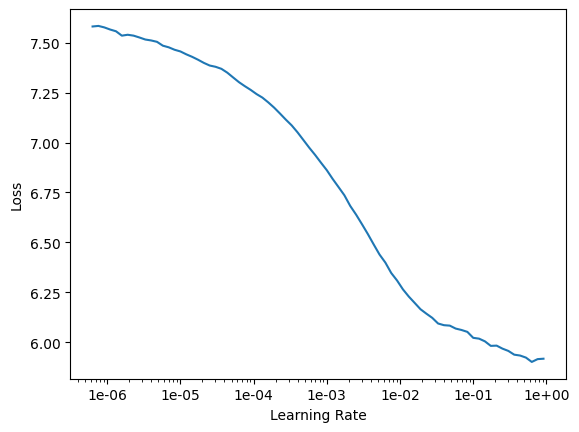

In [38]:
gc.collect()
learn_gen.lr_find()
learn_gen.recorder.plot()

In [39]:
lr = 1e-3

In [40]:
def do_fit(save_name, lrs=slice(lr), pct_start=0.9):
    learn_gen.fit_one_cycle(10, lrs, pct_start=pct_start)
    learn_gen.save(save_name)
    learn_gen.show_results(rows=1, imgsize=5)

epoch,train_loss,valid_loss,psnr,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,4.463794,4.218459,11.610421,0.172397,0.261140,0.363548,0.258414,0.621985,1.356365,1.184611,00:31
1,4.059807,4.094302,11.864611,0.170216,0.259231,0.356059,0.251363,0.592234,1.312706,1.152494,00:30
2,3.936292,3.971183,12.199461,0.166867,0.254153,0.346438,0.243188,0.565513,1.273447,1.121577,00:30
3,3.824446,3.887841,12.292403,0.164807,0.254057,0.341413,0.236336,0.553213,1.248507,1.089507,00:30
4,3.765369,3.807784,12.374860,0.166122,0.249623,0.334067,0.229974,0.544956,1.220173,1.062867,00:30
5,3.702535,3.790364,12.191793,0.170090,0.249349,0.332869,0.228390,0.534241,1.219822,1.055603,00:30
6,3.644288,3.677066,12.446105,0.160529,0.246979,0.325354,0.221928,0.513954,1.182602,1.025719,00:30
7,3.596208,3.665518,12.227850,0.170643,0.246076,0.324165,0.220407,0.506214,1.173310,1.024703,00:30
8,3.553720,3.626146,12.502874,0.159932,0.244119,0.321505,0.217555,0.506759,1.169887,1.006389,00:30
9,3.454094,3.515411,12.672124,0.154205,0.241116,0.314074,0.211683,0.478232,1.132592,0.983509,00:30


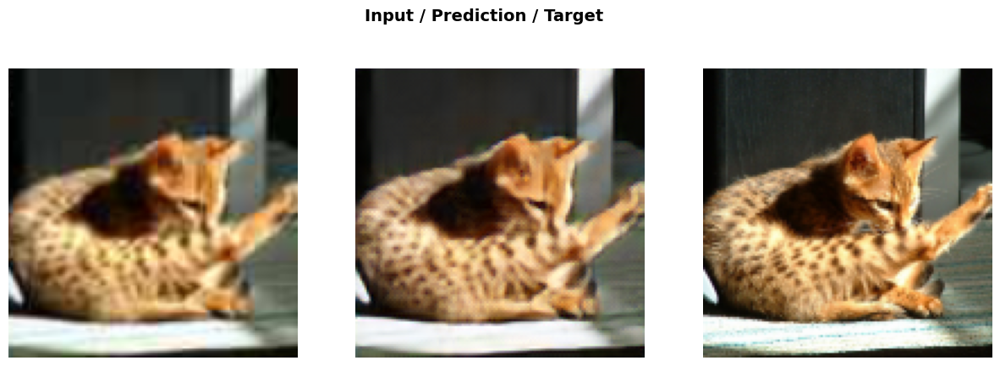

In [41]:
do_fit('1a', slice(lr*10))

epoch,train_loss,valid_loss,psnr,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,3.382012,3.505648,12.651313,0.154554,0.240865,0.313516,0.211301,0.474444,1.128609,0.982359,00:31
1,3.367641,3.498402,12.666321,0.154241,0.240557,0.312914,0.210914,0.473051,1.126194,0.980532,00:31
2,3.368372,3.491661,12.682604,0.153598,0.240420,0.312499,0.210432,0.471598,1.124743,0.978370,00:31
3,3.349085,3.486129,12.691458,0.153731,0.240125,0.312122,0.210116,0.470889,1.122795,0.976352,00:31
4,3.345156,3.478044,12.683389,0.153550,0.240129,0.311765,0.209937,0.467799,1.120030,0.974834,00:31
5,3.326493,3.474152,12.673354,0.153647,0.239304,0.311094,0.209210,0.468938,1.118447,0.973512,00:31
6,3.314057,3.467374,12.699002,0.153281,0.238968,0.310114,0.208946,0.468007,1.116265,0.971794,00:31
7,3.310393,3.459442,12.713739,0.152831,0.239569,0.310136,0.208378,0.464494,1.114748,0.969288,00:31
8,3.288805,3.452035,12.706486,0.153204,0.238412,0.308825,0.207854,0.464410,1.110528,0.968802,00:31
9,3.257534,3.437829,12.676952,0.153452,0.238673,0.308524,0.207163,0.458777,1.106498,0.964743,00:31


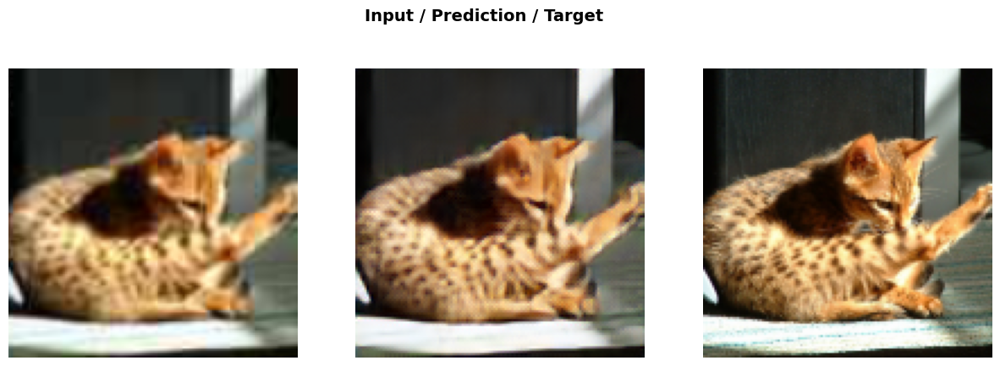

In [42]:
learn_gen.unfreeze()
do_fit('1b', slice(1e-5,lr))

epoch,train_loss,valid_loss,psnr,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,3.242814,3.433443,12.706045,0.152768,0.238340,0.308278,0.206910,0.458674,1.105731,0.962742,00:31
1,3.241318,3.433964,12.727900,0.152680,0.238574,0.308443,0.206875,0.458650,1.106633,0.962110,00:31
2,3.231249,3.433512,12.693941,0.152864,0.238329,0.308177,0.207119,0.457299,1.105935,0.963789,00:31
3,3.234599,3.432327,12.730554,0.152342,0.238325,0.308065,0.206592,0.459467,1.105983,0.961552,00:31
4,3.234728,3.430099,12.696773,0.153797,0.238503,0.308115,0.206467,0.456560,1.105372,0.961284,00:31
5,3.217416,3.431127,12.732453,0.152885,0.237879,0.307864,0.206463,0.459277,1.105474,0.961285,00:31
6,3.215859,3.432312,12.728074,0.152569,0.238242,0.308090,0.206526,0.458700,1.107151,0.961032,00:31
7,3.208684,3.423331,12.749715,0.151585,0.237712,0.307264,0.205838,0.457701,1.103880,0.959349,00:31
8,3.199838,3.414997,12.703354,0.152716,0.237850,0.306918,0.205383,0.454448,1.099766,0.957917,00:31
9,3.172938,3.401385,12.706315,0.152508,0.237249,0.305940,0.204567,0.451572,1.095237,0.954312,00:31


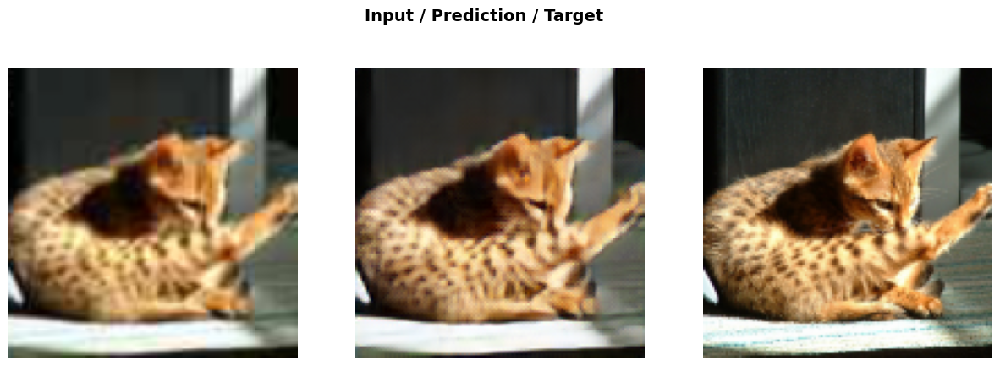

In [43]:
learn_gen.unfreeze()
do_fit('1c', slice(1e-5,lr))

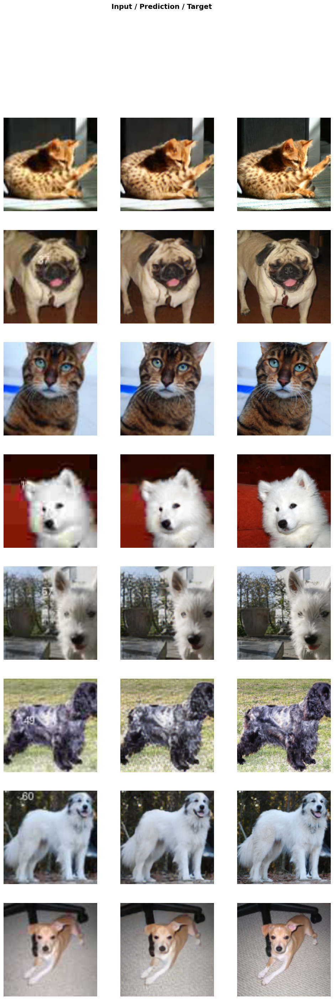

In [44]:
learn_gen.show_results(rows=8)

In [ ]:
# End the W&B run
wandb.finish()

#### Results

After about 30 epochs each (about 10-15 minutes), the model with the HFENN-MSE loss had a higher PNSR, although the perceptual loss seemed to be doing a little better overall. It's not immediately apparent in the first cat picture above, but some other images showed clear improvement with the perceptual loss, e.g., in the texture of a carpet in one image with a dog.  Ideally, we'd also compare the two using with other objective measures, such as Fréchet Inception Distance (FID).

## Method 3: GANs

To improve the results we'll use Generative Adversarial Networks (GANs). A GAN uses a loss function that's actually another model (the Discriminator). 

**Current Model:**
* We have a Crappy Image, we use a generator to create a Predicted image.
* We have a Hi-res image, and compare it with the Predicted image with per-pixel MSE

**GAN model:**
* We train another model: Discriminator/Critic
* This is a binary classification model that takes all the pairs (generated image, hi-res image)
* Tries to classify which image is which. 
* The goal is to generate images realistic enough so that we can fool the Discriminator to think they are real/hi-res. 

**Process:**
1. Train the Generator using the Discriminator as loss function until it gets very good fooling the Discriminator. 
2. Stop training the Generator, now train the Discriminator on the newly generated images and hi-res images. Now it's a tougher task for the Discriminator to decide which image is real and which is generated/fake. This makes the Discriminator to get better at recognizing which image is fake and which is real. 
3. Go back and fine-tune the Generator using the improved Discriminator as loss function. 
4. Repeat this cycle a few times.

### Train the Critic / Discriminator

Define `get_crit_data()` to implement a standard image classifier that predicts whether an image is real/hi-res or generated/crappy.

In [80]:
bs,size = 64, 128

In [81]:
def get_crit_data(classes, bs, size):
    src = ImageList.from_folder(path, include=classes).split_by_rand_pct(0.1, seed=40)
    ll = src.label_from_folder(classes=classes)
    data = (ll.transform(tfms, size=size)
            .databunch(bs=bs)
            .normalize(imagenet_stats))
    data.c = 3
    return data

Note: `name_gen` is the generator's output folder, defined in the "Save images" section of Method 1 above.

In [82]:
name_gen = 'image_gen' # output images from Method 1 (MSE-HFENN loss)

In [83]:
data_crit = get_crit_data([name_gen, 'images'], bs=bs, size=size)

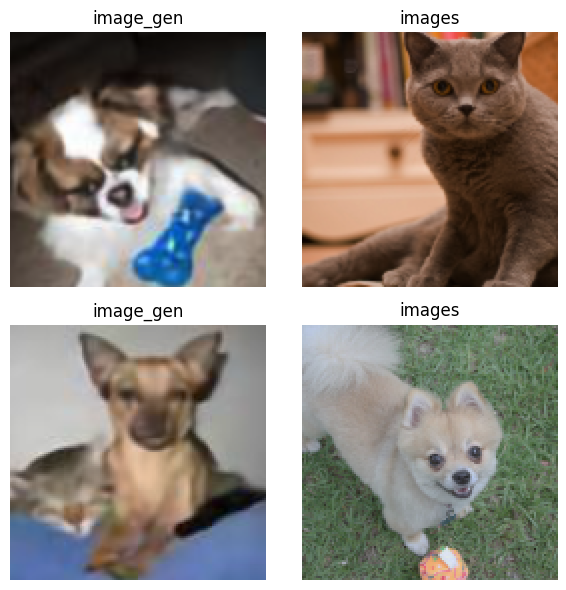

In [84]:
data_crit.show_batch(rows=2, ds_type=DatasetType.Train, imgsize=3)

### Loss function
As loss function, we'll use Binary Cross-Entropy (BCE), which is standard for binary (True/False) classification tasks.

**TO DO:** Instead of a BCE loss, we could try a Relativistic Loss, which can improve adversarial training.

In [84]:
loss_critic = AdaptiveLoss(nn.BCEWithLogitsLoss())

Create the critic learner.

* In Fast.ai using `gan_critic()` as model will provide you with a binary classifier suitable for GANs. 
* the `gan_critic()` uses a different way of averaging the different parts of the image when using the loss. That's why we use the AdaptiveLoss function to wrap the Binary Cross-Entropy Loss. 
* We also use a different metric: `accuracy_thresh_expand`

In [85]:
wd = 1e-3  # weight decay value for regularization

def create_critic_learner(data, metrics):
    return Learner(data, gan_critic(), metrics=metrics, loss_func=loss_critic, wd=wd)

Train the Critic

In [86]:
learn_critic = create_critic_learner(data_crit, accuracy_thresh_expand)

In [87]:
learn_critic.fit_one_cycle(6, 1e-3)

epoch,train_loss,valid_loss,accuracy_thresh_expand,time
0,0.689297,0.690172,0.529572,00:29
1,0.587182,0.494506,0.770333,00:29
2,0.332165,0.177657,0.945370,00:29
3,0.141314,0.094593,0.965438,00:29
4,0.081444,0.054721,0.984690,00:29
5,0.057910,0.045879,0.986676,00:29


In [88]:
# Save the model
learn_critic.save('critic-pre2')

### GAN Learner callback for W&B

Let's create a callback for experiment tracking in Weights & Biases.

In [ ]:
# class GANDebugCallback(Callback):
#     def __init__(self, learn):
#        self.learn = learn
      
#     def on_batch_end(self, **kwargs):
#         # Print GAN trainer attributes
#         trainer = self.learn.gan_trainer
#         print("GAN Trainer attributes:", [attr for attr in dir(trainer) if not attr.startswith('_') and not callable(getattr(trainer, attr))])
#         return {}

In [89]:
class WandbGANCallbackV1(Callback):
    def __init__(self, learn, log="gradients"):
        self.learn = learn
        self.log = log
        self.gen_losses = []
        self.disc_losses = []
        
    def on_train_begin(self, **kwargs):
        "Initialize W&B logging and watch model"
        if wandb.run is None:
            raise ValueError('You must call wandb.init() before using GANWandbCallbackV1')
        
        wandb.watch(self.learn.model, log=self.log)
        
    def on_epoch_begin(self, **kwargs):
        "Reset loss tracking at the beginning of each epoch"
        self.gen_losses = []
        self.disc_losses = []
        
    def on_batch_end(self, iteration, last_loss, **kwargs):
        "Log training loss and collect GAN losses"
        wandb.log({"train_loss": last_loss})
        
        # Extract losses from gan_trainer
        trainer = self.learn.gan_trainer
        if trainer.glosses:
            self.gen_losses.append(trainer.glosses[-1])
        if trainer.closses:
            self.disc_losses.append(trainer.closses[-1])

        # Log learning rate
        lr = self.learn.opt.lr  # Get learning rate
        wandb.log({"learning_rate": lr})
        
    def on_epoch_end(self, epoch, last_metrics, **kwargs):
        "Log validation loss, metrics, and GAN-specific losses"
        log_data = {"epoch": epoch, "valid_loss": last_metrics[0]}

        # Add standard metrics if available
        if len(last_metrics) > 1:
            for i, metric in enumerate(self.learn.metrics):
                metric_name = metric.__name__ if hasattr(metric, '__name__') else f"metric_{i}"
                log_data[metric_name] = last_metrics[i + 1]
        
        # Compute average losses safely
        log_data["gen_loss"] = sum(self.gen_losses) / len(self.gen_losses) if self.gen_losses else 0.0
        log_data["disc_loss"] = sum(self.disc_losses) / len(self.disc_losses) if self.disc_losses else 0.0
            
        wandb.log(log_data)
        
        return {}  # Ensure fastai doesn't break

In [90]:
wandb.finish()

In [ ]:
# Initialize W&B project
wandb.init(project="super-resolution-GAN", name="ResNet-Training-GAN-r4")

### GAN Learner metrics fix

Fastai automatically logged `valid_loss` and `train_loss` but didn't seem to report the `gen_loss` and `disc_loss`, despite appearing as column names in the output (see Ignacio's original notebook for an example). I'm not sure what's going on there, but I had to manually append them to the learner's metrics to get them to show any data in the output table.

The following callback adds two key functions:

* Smooth trend metrics: Ensures the exponentially weighted moving averages of generator and discriminator losses are properly displayed in the training table.
* Raw loss metrics: Captures and displays the unsmoothed, immediate loss values from the most recent batch in each epoch.

From what I can gather, the switcher is based on the raw instantaneous per-batch loss values. The GANTrainer keeps track of smoothed loss values using the SmoothenValue class.

In [96]:
class GANMetricsFixCallback(LearnerCallback):
    _order = -19  # Make sure it runs right after GANTrainer which is at -20
    
    def on_train_begin(self, **kwargs):
        # Add raw metrics names to the recorder
        self.learn.recorder.add_metric_names(['gen_loss_raw', 'disc_loss_raw'])
        # Create lists to store raw loss values
        self.raw_gen_losses = []
        self.raw_disc_losses = []
    
    def on_backward_begin(self, last_loss, **kwargs):
        # Store the raw loss value before any smoothing
        if self.learn.gan_trainer.gen_mode:
            self.raw_gen_losses.append(last_loss.float().detach().cpu())
        else:
            self.raw_disc_losses.append(last_loss.float().detach().cpu())
    
    def on_epoch_end(self, last_metrics, **kwargs):
        trainer = self.learn.gan_trainer
        
        # Check if metrics have already been added
        if len(last_metrics) < len(self.learn.recorder.metrics) + 4:
            # Get smoothed losses
            # gen_loss = trainer.glosses[-1] if trainer.glosses else float('nan') # Is exactly the same as:
            gen_loss = trainer.smoothenerG.smooth if hasattr(trainer, 'smoothenerG') and trainer.glosses else float('nan')
            # disc_loss = trainer.closses[-1] if trainer.closses else float('nan') # Is exactly the same as:
            disc_loss = trainer.smoothenerC.smooth if hasattr(trainer, 'smoothenerC') and trainer.closses else float('nan')
            
            # Get raw losses - last values from our own lists
            gen_loss_raw = self.raw_gen_losses[-1] if self.raw_gen_losses else float('nan')
            disc_loss_raw = self.raw_disc_losses[-1] if self.raw_disc_losses else float('nan')
            
            # Clear raw loss lists for next epoch
            self.raw_gen_losses = []
            self.raw_disc_losses = []
            
            # Add both smoothed and raw metrics
            return add_metrics(last_metrics, [gen_loss, disc_loss, gen_loss_raw, disc_loss_raw])
        return last_metrics

### Build the GAN Learner

We now have the pre-trained Generator and the pre-trained Critic. We'll combine both in a GAN and do a little bit of ping-pong between both. 

In [97]:
torch.cuda.empty_cache()
learn_crit=None
learn_gen=None
learn=None
gc.collect()

0

In [98]:
#!nvidia-smi

In [99]:
data_crit = get_crit_data(['small-96', 'images'], bs=bs, size=size)

In [100]:
learn_crit = create_critic_learner(data_crit, metrics=None).load('critic-pre2')

In [101]:
learn_gen = create_gen_learner().load('gen-pre-128px') # from Method 1

To define a GAN Learner:
- Specify the learner objects for the generator and the critic. 
- The switcher is a callback that decides when to switch from discriminator to generator and vice versa. 
- Here we do as many iterations of the discriminator as needed to get its loss back < 0.5* then 1 iteration of the generator.
- The **loss of the critic** is given by `learn_crit.loss_func`. We take the average of this loss function on the batch of real predictions (target 1) and the batch of fake predicitions (target 0). 
- The **loss of the generator** is weighted sum (weights in `weights_gen`) of `learn_crit.loss_func` on the batch of fake (passed throught the critic to become predictions) with a target of 1, and the `learn_gen.loss_func` applied to the output (batch of fake) and the target (corresponding batch of superres images).

\* This seems to be a typo in the fastai notebook as `critic_thresh` was `=0.65`. The switcher will go back to generator or critic when the raw loss goes below `gen_thresh` or `crit_thresh`, respectively. Given `gen_thresh=None` and `critic_thresh=0.65`, the generator will always switch after each batch, and the critic will only switch back if the loss is below 0.65.

In [102]:
switcher = partial(AdaptiveGANSwitcher, critic_thresh=0.65)

learn = GANLearner.from_learners(
    learn_gen, 
    learn_crit, 
    weights_gen=(1.,50.), # generator_loss = 1 * adversarial_loss + 50 * task_loss
    show_img=False, 
    switcher=switcher,
    opt_func=partial(optim.Adam, betas=(0.,0.99)), 
    #wd=wd,
)

learn.callback_fns.append(partial(GANDiscriminativeLR, mult_lr=5.))
learn.callback_fns.append(partial(WandbGANCallbackV1))  # Added WandbCallbackV1
learn.callbacks.append(GANMetricsFixCallback(learn)) # Fixed metrics
#learn.callback_fns.append(partial(GANDebugCallback))  # For debugging, if needed

### Train model

In [103]:
lr = 1e-3

In [104]:
learn.fit(3,lr)

epoch,train_loss,valid_loss,gen_loss,disc_loss,gen_loss_raw,disc_loss_raw,time
0,3.634528,4.082250,7.819551,1.011981,7.031360,0.617481,00:33
1,3.612664,3.805503,7.520355,0.721931,8.342319,0.606393,00:32
2,3.632319,3.862400,7.699384,0.661374,6.645731,0.590751,00:33


In [105]:
lr = 1e-4

In [106]:
learn.fit(30,lr)

epoch,train_loss,valid_loss,gen_loss,disc_loss,gen_loss_raw,disc_loss_raw,time
0,3.803530,4.213697,6.938157,0.576250,7.035525,0.624111,00:32
1,3.535189,4.064830,6.903296,0.606679,6.522213,0.606897,00:32
2,3.537888,4.119949,6.892123,0.608240,6.595828,0.571093,00:32
3,3.665081,3.569509,6.902845,0.596830,6.312525,0.598626,00:32
4,3.515722,4.174442,6.729827,0.603560,6.286102,0.575988,00:32
5,3.512122,4.016525,6.716856,0.588363,6.392767,0.559327,00:32
6,3.406476,4.042612,6.622221,0.593184,7.557092,0.506904,00:32
7,3.452623,3.840683,6.628284,0.582782,6.413138,0.549149,00:32
8,3.560334,4.053503,6.632823,0.580564,7.011209,0.571431,00:32
9,3.509832,3.950843,6.583471,0.584741,6.294539,0.549307,00:32


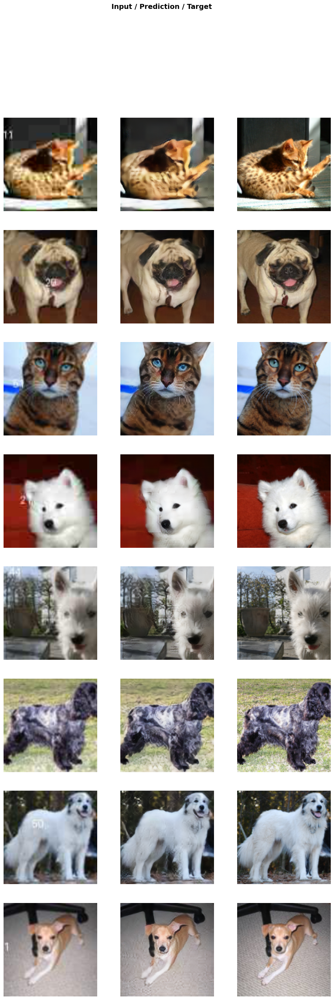

In [107]:
learn.show_results(rows=8)

In [ ]:
wandb.finish()

### Results

Generally, the results weren't too bad at this tiny resolution, using a generator with an MSE-HFENN loss function. For example, some of the texture was beginning to reappear, like the carpet in the last image. The perceptual loss model (Method 2) was perhaps better, but it's marginal and quite subjective (using PSNR and/or FID would be useful). Compared to the images in the original fastai notebook, these actually seem a lot better. However, there's definitely room for improvement everywhere, with longer training and hyperparameter search/optimization.

In [ ]:
# Save the model
learn.save('gan-1a')

In [60]:
#learn.fit(20,lr/2)
#learn.fit(20,lr/10)

In [61]:
#learn.save('gan-1b')

In [62]:
#learn.show_results(rows=2)

###  Update batch size and resolution then continue training

Here we could continue training with a lower learning rate for fine-tuning the results.

A common GAN training trick is to:

* Start with lower-resolution images (e.g., 128x128) for faster training.
* Gradually increase resolution (e.g., 192x192, then 256x256) for better details.

The train loss will increase initially because the model now sees more detailed images, making training harder.

In [63]:
learn.data=get_data(32,192)

In [ ]:
learn.fit(10,lr/2)

In [65]:
learn.save('gan-1c')